<a href="https://colab.research.google.com/github/VictorRocasa/Processamento_de_Imagens/blob/master/PI_Tarefas_da_Terceira_Semana_(ERE)_Victor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instruções

1. Resolva todos os exercícios abaixo.
2. Salve uma cópia desse notebook em um repositório no GitHub.
3. Envie o link do repositório criado para o professor.
4. Envie um áudio curto ao professor explicando cada solução criada por você.

# 1. Adição de Imagens

No vídeo abaixo, eu mostro uma maneira de se fazer adição de imagens (inserir uma imagem menor dentro de uma imagem maior), podendo inclusive combinar esse efeito com a transparência.

<a href="https://www.youtube.com/watch?v=60k962jJAmE"><img src="https://img.youtube.com/vi/60k962jJAmE/mqdefault.jpg"/></a>

Dito isso, faça um algoritmo que receba uma imagem e insira uma marca d'água sobre essa figura. Considere a imagem abaixo como referência.

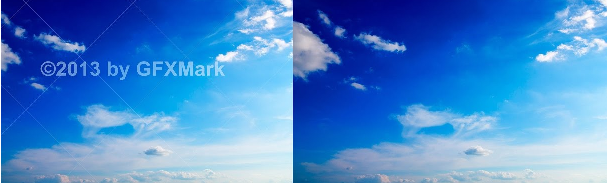

Imagem original


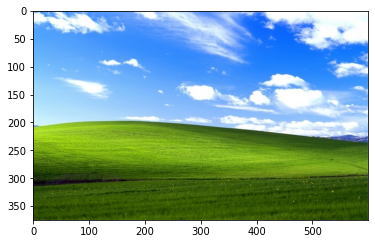

Marca D'agua


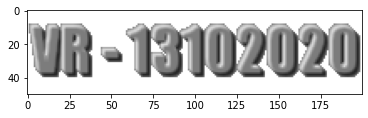

Imagem com marca


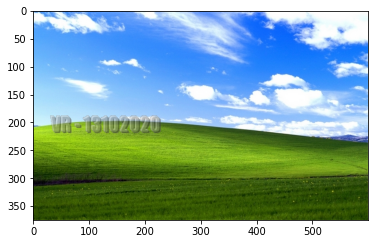

In [ ]:
#insira seu código aqui
import numpy as np
import cv2


def addMarca(imagem, marca):
  ai, li, _ = imagem.shape
  posY = int(ai*0.48)#pocisionar marca d'gua na cordenada Y coorespondende a 48% da imagem destino
  posX = int(li*0.05)#pocisionar marca d'gua na cordenada X coorespondende a 05% da imagem destino
  am, lm, _ = marca.shape
  pesoMarca = 0.5#50% de transparencia na marca d'gua
  for y in range(0, am):
    for x in range(0, lm):
      if(marca.item(y,x,0) < 240 and marca.item(y,x,1) < 240 and marca.item(y,x,2) < 240):#Para cada pixel da marca que não é totalmente branco, realizar o blending
         pixelVermelho = int((imagem.item(y+posY,x+posX,0) * (1-pesoMarca)) + (marca.item(y,x,0) * pesoMarca))
         pixelVerde = int((imagem.item(y+posY,x+posX,1) * (1-pesoMarca)) + (marca.item(y,x,1) * pesoMarca))
         pixelAzul = int((imagem.item(y+posY,x+posX,2) * (1-pesoMarca)) + (marca.item(y,x,2) * pesoMarca))
         imagem.itemset((y+posY,x+posX,0), pixelVermelho)
         imagem.itemset((y+posY,x+posX,1), pixelVerde)
         imagem.itemset((y+posY,x+posX,2), pixelAzul)


imgFone = cv2.imread("/content/drive/My Drive/Colab Notebooks/plagio.jpg")
imgAqua = cv2.imread("/content/drive/My Drive/Colab Notebooks/marcadagua.png")
from matplotlib import  pyplot as plt
imgFone = cv2.cvtColor(imgFone, cv2.COLOR_BGR2RGB)
imgAqua = cv2.cvtColor(imgAqua, cv2.COLOR_BGR2RGB)
print("Imagem original")
plt.imshow(imgFone)
plt.show()
print("Marca D'agua")
plt.imshow(imgAqua)
plt.show()
addMarca(imgFone,imgAqua)
print("Imagem com marca")
plt.imshow(imgFone)
plt.show()

#2. Rastreamento (Tracking)

Quando falamos do rastreamento de um objeto, estamos nos referindo a uma aplicação que "acompanha" o movimento de um objeto em um vídeo, marcando a posição dele tipicamente em caixas envolventes. Abaixo tem-se um exemplo:

<img src="https://i.pinimg.com/originals/41/36/f9/4136f909c378936cdf33f2cd975d081c.gif"/>

Nesse exercício, implemente o rastreio de um objeto com uma cor definida, nos moldes do exemplo do vídeo abaixo.

<a href="https://www.youtube.com/watch?v=M2wcIsMXPEA"><img src="https://img.youtube.com/vi/M2wcIsMXPEA/mqdefault.jpg"/></a>

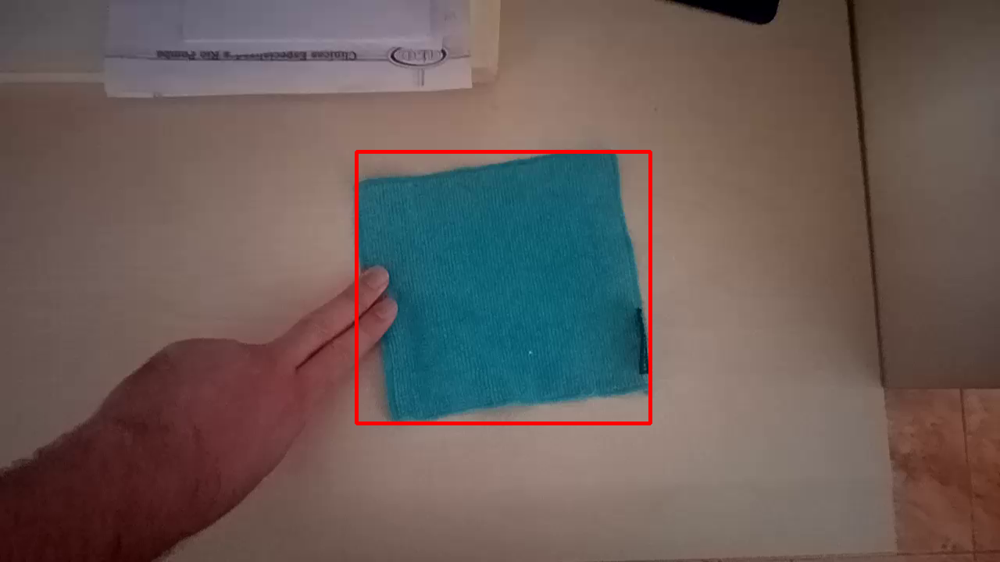

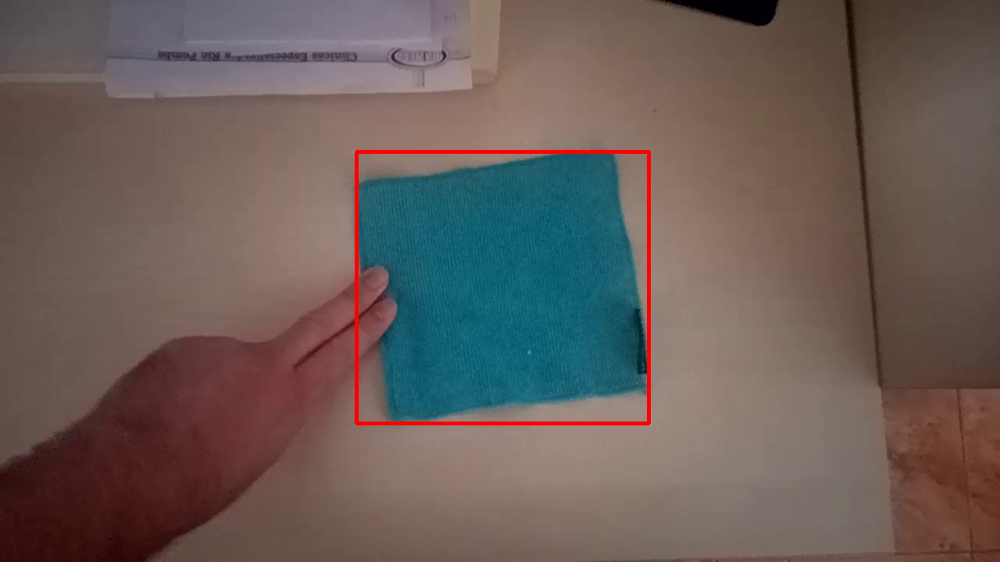

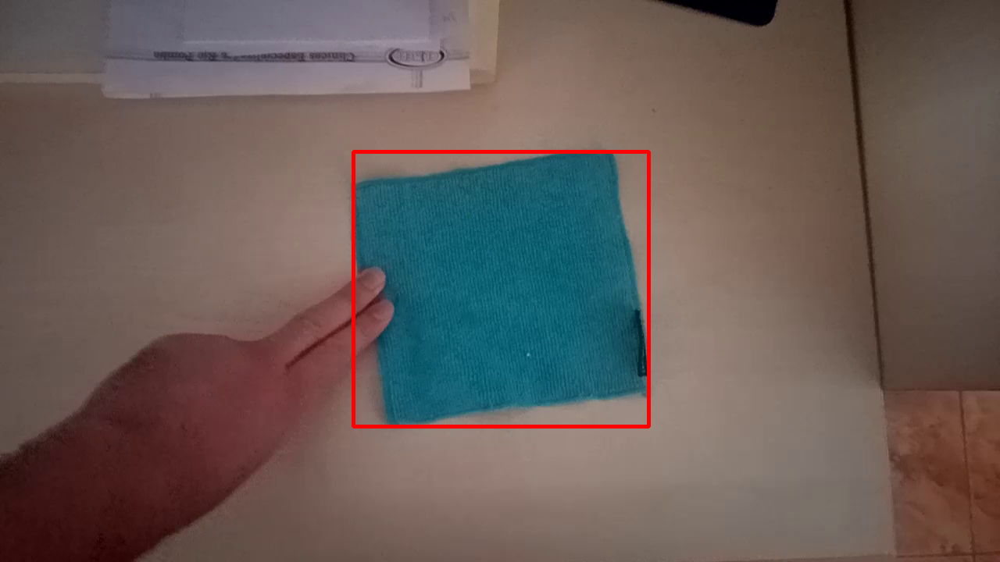

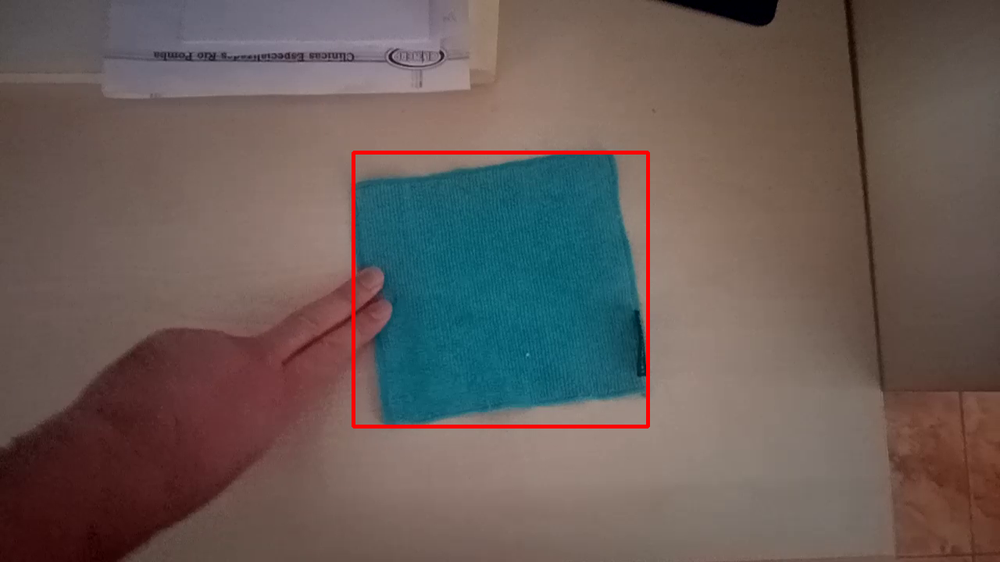

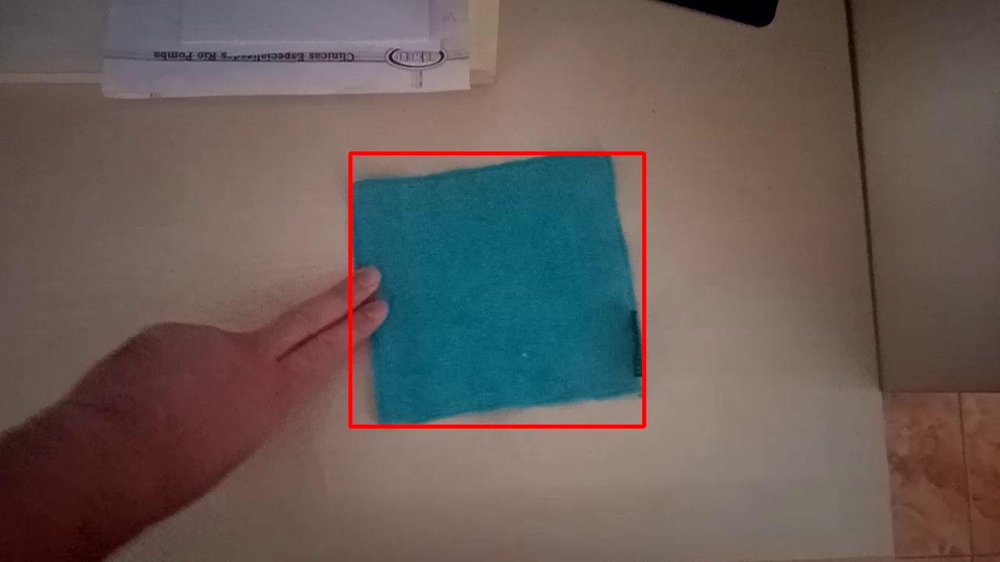

...

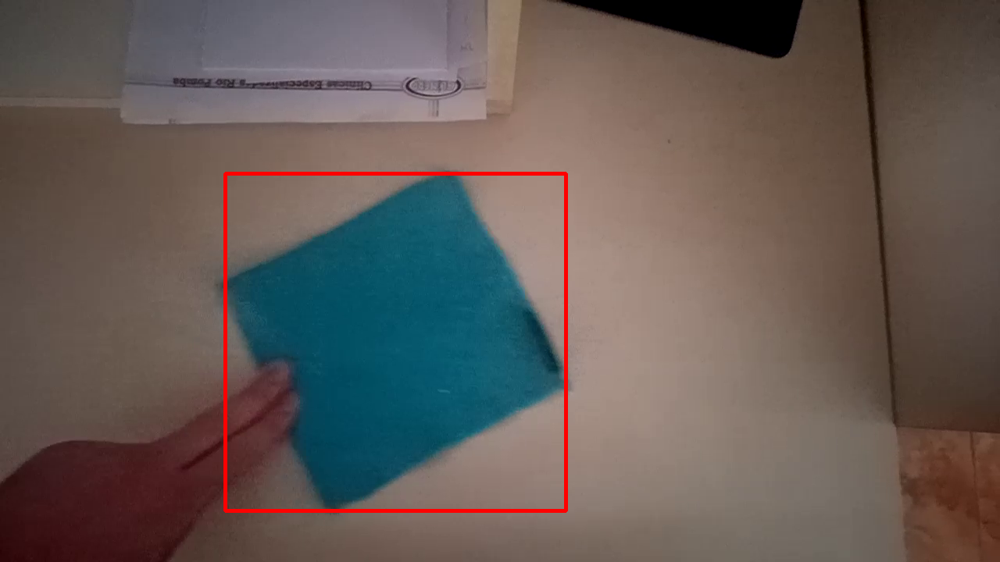

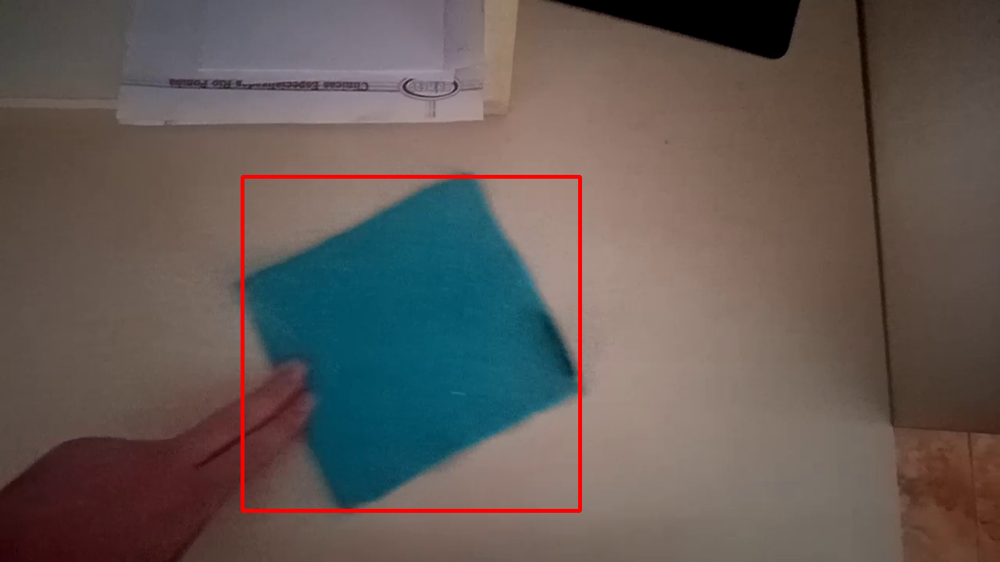

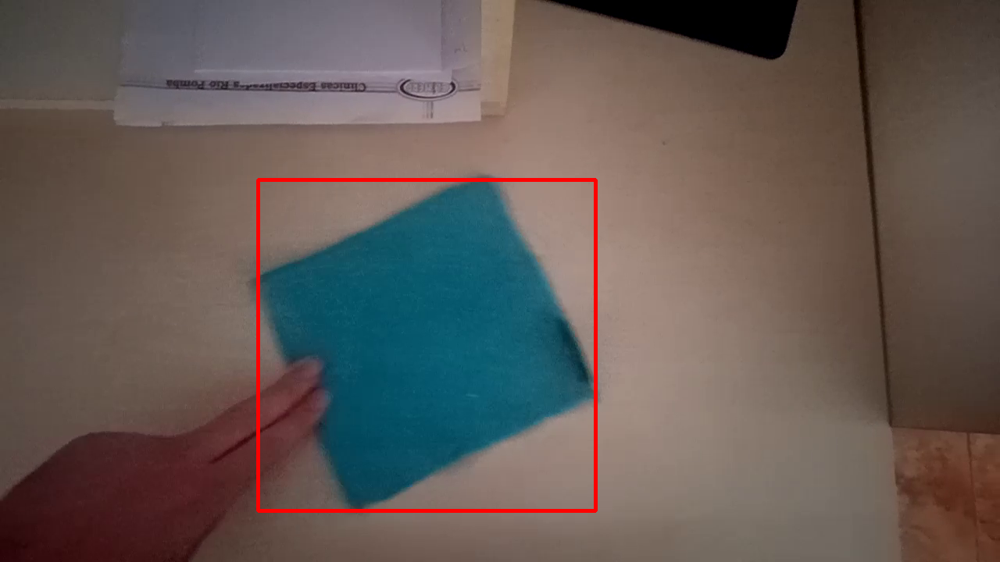

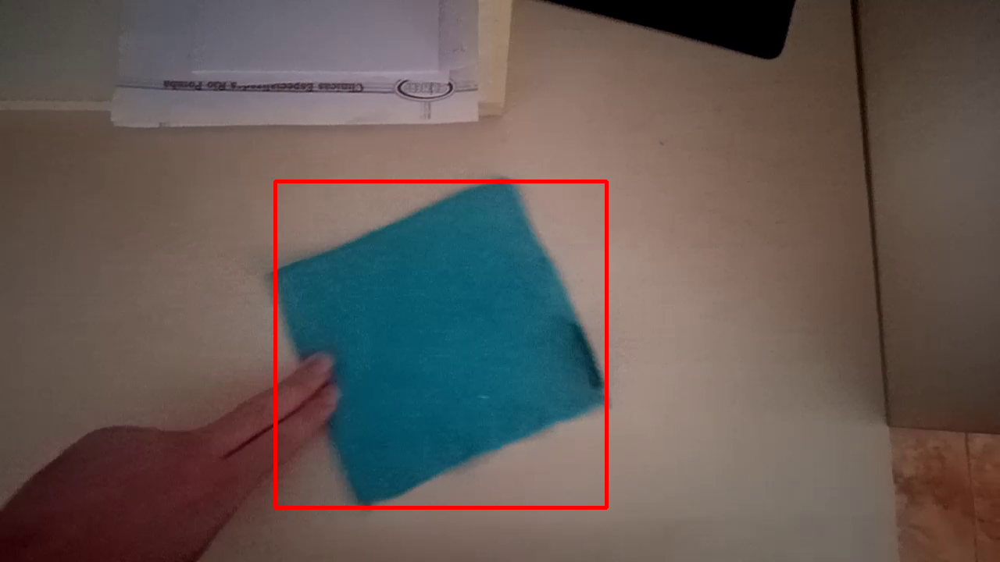

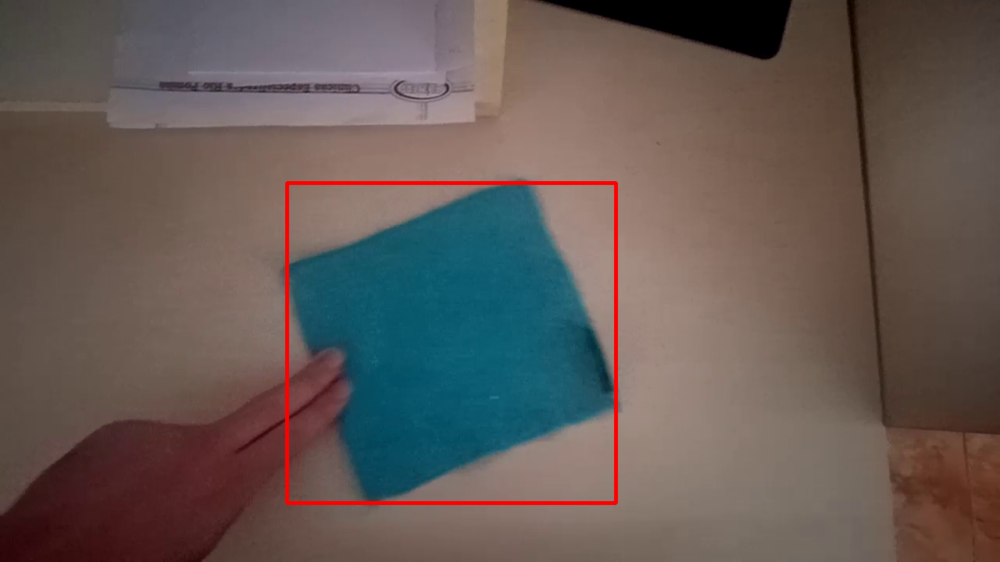

Fim do vídeo


In [ ]:
#Insira seu código aqui
from google.colab.patches import cv2_imshow
import numpy as np
import cv2

cap = cv2.VideoCapture('/content/drive/My Drive/Colab Notebooks/pano.mp4')
framesPrintados = 0
while(True):
  existe, frame = cap.read()
  if(not existe or framesPrintados == 40):#se o video acabar ou chegar em seu frame de número 40, o algoritimo acaba
    break
  hsvFrame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
  azulMinimo = np.array([80,50,0])
  azulMaximo = np.array([150,255,255])
  mask = cv2.inRange(hsvFrame, azulMinimo, azulMaximo)
  contornos,_ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  if(contornos):
    maxArea = cv2.contourArea(contornos[0])
    id = 0
    i = 0
    for cnt in contornos:
      if(maxArea < cv2.contourArea(cnt)):
        maxArea = cv2.contourArea(cnt)
        id = i
      i = i + 1
    x , y, w , h = cv2.boundingRect(contornos[id])
    if(maxArea >100):
      cv2.rectangle(frame, (x,y), (x+w,y+h), (0,0,255), 3)
  cv2_imshow(frame)
  framesPrintados = framesPrintados + 1
cap.release()
cv2.destroyAllWindows()
print("Fim do vídeo")

#3. Proposta do Trabalho Final

Acesse o SIGAA e no fórum "Proposta de Trabalho Final", você deve elaborar o conceito do seu trabalho final.

Essa proposta deverá constar de:

* Tema (Reconhecimento de Faces? Diagnóstico de Doenças por Imagem? Verificação de Qualidade em Linha de Montagem por Imagem? Astronomia e Machine Learning?)
* Problema a ser Resolvido (Se seu protótipo der certo, qual solução ele trará a sociedade? Para qual finalidade ele será usado?)
* Método a ser usado (Qual algoritmo você implementará para resolver o problema apontado?)

